<a href="https://colab.research.google.com/github/Ishrar436/CVPR/blob/main/CNN_22_49436_3(2).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Loading and Preprocessing

Dataset link :
https://www.kaggle.com/competitions/paddy-disease-classification/overview

Load dataset using PyTorch

In [31]:
from google.colab import drive
drive.mount('/content/drive')

import os

# Paths
BASE_DIR = "/content/drive/MyDrive/CVPR Dataset"
TRAIN_DIR = os.path.join(BASE_DIR, "train_images")
TEST_DIR  = os.path.join(BASE_DIR, "test_images")

print("BASE_DIR exists:", os.path.exists(BASE_DIR))
print("TRAIN_DIR exists:", os.path.exists(TRAIN_DIR))
print("TEST_DIR exists:", os.path.exists(TEST_DIR))

print("\nTrain class folders:")
print(sorted(os.listdir(TRAIN_DIR))[:20])

print("\nNumber of train class folders:", len(os.listdir(TRAIN_DIR)))
print("Number of test images:", len(os.listdir(TEST_DIR)))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
BASE_DIR exists: True
TRAIN_DIR exists: True
TEST_DIR exists: True

Train class folders:
['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']

Number of train class folders: 10
Number of test images: 3469


In [32]:
import torch
from torchvision import datasets, transforms

IMG_SIZE = 128

# Transforms
train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(10),
    transforms.ToTensor()
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

In [33]:
# Load dataset using PyTorch
full_dataset = datasets.ImageFolder(root=TRAIN_DIR)

class_names = full_dataset.classes
targets = full_dataset.targets

print("\nClasses:", class_names)
print("Number of classes:", len(class_names))
print("Total images:", len(full_dataset))


Classes: ['bacterial_leaf_blight', 'bacterial_leaf_streak', 'bacterial_panicle_blight', 'blast', 'brown_spot', 'dead_heart', 'downy_mildew', 'hispa', 'normal', 'tungro']
Number of classes: 10
Total images: 10407


Create training and validation data loaders with batch size

In [34]:
from torch.utils.data import DataLoader, Subset
from sklearn.model_selection import train_test_split

# Settings
BATCH_SIZE = 32
SEED = 42

# Split into train and validation
indices = list(range(len(full_dataset)))

# Step 1: split into train (80%) and temp (20%)
train_idx, temp_idx = train_test_split(
    indices,
    test_size=0.2,
    stratify=targets,
    random_state=SEED
)

# Targets for temp split
temp_targets = [targets[i] for i in temp_idx]

# Step 2: split temp into validation (10%) and test (10%)
val_idx, test_idx = train_test_split(
    temp_idx,
    test_size=0.5,
    stratify=temp_targets,
    random_state=SEED
)

In [35]:
# Apply transforms separately
train_dataset = datasets.ImageFolder(root=TRAIN_DIR, transform=train_transform)
val_dataset   = datasets.ImageFolder(root=TRAIN_DIR, transform=val_transform)
test_dataset  = datasets.ImageFolder(root=TRAIN_DIR, transform=val_transform)

# Create subsets
train_subset = Subset(train_dataset, train_idx)
val_subset   = Subset(val_dataset, val_idx)
test_subset  = Subset(test_dataset, test_idx)

In [36]:
# Create DataLoaders
train_loader = DataLoader(train_subset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print("Train samples:", len(train_subset))
print("Validation samples:", len(val_subset))
print("Test samples:", len(test_subset))

print("Train batches:", len(train_loader))
print("Validation batches:", len(val_loader))
print("Test batches:", len(test_loader))

Train samples: 8325
Validation samples: 1041
Test samples: 1041
Train batches: 261
Validation batches: 33
Test batches: 33


# Model Architecture

Build a custom CNN

In [37]:
# Model Architecture Setup

import torch
import torch.nn as nn

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = len(class_names)

print("Device:", DEVICE)
print("Number of classes:", NUM_CLASSES)

Device: cuda
Number of classes: 10


In [38]:
# Custom CNN (Base Model)

class CustomCNN(nn.Module):
    def __init__(self, num_classes=10):
        super(CustomCNN, self).__init__()

        self.conv_layer1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv_layer2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv_layer3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.relu3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 16 * 16, 256)
        self.relu4 = nn.ReLU()
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.conv_layer1(x)
        x = self.relu1(x)
        x = self.pool1(x)

        x = self.conv_layer2(x)
        x = self.relu2(x)
        x = self.pool2(x)

        x = self.conv_layer3(x)
        x = self.relu3(x)
        x = self.pool3(x)

        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu4(x)
        x = self.fc2(x)

        return x

In [39]:
# Initialize the Base CNN

model_base = CustomCNN(num_classes=NUM_CLASSES).to(DEVICE)

print(model_base)

CustomCNN(
  (conv_layer1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_layer2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv_layer3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3): ReLU()
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (fc1): Linear(in_features=32768, out_features=256, bias=True)
  (relu4): ReLU()
  (fc2): Linear(in_features=256, out_features=10, bias=True)
)


Try with and without batch normalization and dropout for regularization

In [40]:
# Custom CNN with BatchNorm and Dropout

class CustomCNN_BN_Dropout(nn.Module):
    def __init__(self, num_classes=10):
        super(CustomCNN_BN_Dropout, self).__init__()

        self.conv_layer1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.relu1 = nn.ReLU()
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout(0.25)

        self.conv_layer2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.relu2 = nn.ReLU()
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout(0.25)

        self.conv_layer3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.relu3 = nn.ReLU()
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout(0.25)

        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(128 * 16 * 16, 256)
        self.relu4 = nn.ReLU()
        self.dropout_fc = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.conv_layer1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.pool1(x)
        x = self.dropout1(x)

        x = self.conv_layer2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.pool2(x)
        x = self.dropout2(x)

        x = self.conv_layer3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.pool3(x)
        x = self.dropout3(x)

        x = self.flatten(x)
        x = self.fc1(x)
        x = self.relu4(x)
        x = self.dropout_fc(x)
        x = self.fc2(x)

        return x

In [41]:
# Initialize BN + Dropout CNN

model_bn_dropout = CustomCNN_BN_Dropout(num_classes=NUM_CLASSES).to(DEVICE)

print(model_bn_dropout)

CustomCNN_BN_Dropout(
  (conv_layer1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout(p=0.25, inplace=False)
  (conv_layer2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout(p=0.25, inplace=False)
  (conv_layer3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU()
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout3): Dropout(p=0.25, inplace=False)
  (flatten): F

In [42]:
print("Base Model Ready:", model_base.__class__.__name__)
print("BN + Dropout Model Ready:", model_bn_dropout.__class__.__name__)

Base Model Ready: CustomCNN
BN + Dropout Model Ready: CustomCNN_BN_Dropout


Show Document architecture with a detailed summary

In [43]:
!pip install -q torchinfo

In [44]:
from torchinfo import summary

# Detailed Summary: Base CNN
summary(
    model_base,
    input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=18,
    row_settings=["var_names"]
)
# Detailed Summary: BN + Dropout CNN
summary(
    model_bn_dropout,
    input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=18,
    row_settings=["var_names"]
)

Layer (type (var_name))                       Input Shape        Output Shape       Param #            Trainable
CustomCNN_BN_Dropout (CustomCNN_BN_Dropout)   [32, 3, 128, 128]  [32, 10]           --                 True
├─Conv2d (conv_layer1)                        [32, 3, 128, 128]  [32, 32, 128, 128] 896                True
├─BatchNorm2d (bn1)                           [32, 32, 128, 128] [32, 32, 128, 128] 64                 True
├─ReLU (relu1)                                [32, 32, 128, 128] [32, 32, 128, 128] --                 --
├─MaxPool2d (pool1)                           [32, 32, 128, 128] [32, 32, 64, 64]   --                 --
├─Dropout (dropout1)                          [32, 32, 64, 64]   [32, 32, 64, 64]   --                 --
├─Conv2d (conv_layer2)                        [32, 32, 64, 64]   [32, 64, 64, 64]   18,496             True
├─BatchNorm2d (bn2)                           [32, 64, 64, 64]   [32, 64, 64, 64]   128                True
├─ReLU (relu2)               

In [45]:
# Save summaries for later use

base_summary = summary(
    model_base,
    input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=18,
    row_settings=["var_names"],
    verbose=0
)

bn_dropout_summary = summary(
    model_bn_dropout,
    input_size=(BATCH_SIZE, 3, IMG_SIZE, IMG_SIZE),
    col_names=["input_size", "output_size", "num_params", "trainable"],
    col_width=18,
    row_settings=["var_names"],
    verbose=0
)

print("Base CNN Total Parameters       :", base_summary.total_params)
print("BN + Dropout CNN Total Parameters:", bn_dropout_summary.total_params)

Base CNN Total Parameters       : 8484682
BN + Dropout CNN Total Parameters: 8485130


In [46]:
print("Model 1: CustomCNN (without BatchNorm and Dropout)")
print(" - 3 Convolution layers")
print(" - 3 ReLU activations")
print(" - 3 MaxPooling layers")
print(" - 2 Fully connected layers")
print(" - Final output layer for 10 classes")

print("\nModel 2: CustomCNN_BN_Dropout (with BatchNorm and Dropout)")
print(" - 3 Convolution layers")
print(" - 3 Batch Normalization layers")
print(" - 3 ReLU activations")
print(" - 3 MaxPooling layers")
print(" - 4 Dropout layers")
print(" - 2 Fully connected layers")
print(" - Final output layer for 10 classes")

Model 1: CustomCNN (without BatchNorm and Dropout)
 - 3 Convolution layers
 - 3 ReLU activations
 - 3 MaxPooling layers
 - 2 Fully connected layers
 - Final output layer for 10 classes

Model 2: CustomCNN_BN_Dropout (with BatchNorm and Dropout)
 - 3 Convolution layers
 - 3 Batch Normalization layers
 - 3 ReLU activations
 - 3 MaxPooling layers
 - 4 Dropout layers
 - 2 Fully connected layers
 - Final output layer for 10 classes


# Training and Optimization

Use appropriate optimizer (Adam, SGD)

In [47]:
import torch.optim as optim

LEARNING_RATE = 0.001
print("Learning Rate:", LEARNING_RATE)

Learning Rate: 0.001


In [48]:
# Adam optimizers
optimizer_base = optim.Adam(model_base.parameters(), lr=LEARNING_RATE)
optimizer_bn_dropout = optim.Adam(model_bn_dropout.parameters(), lr=LEARNING_RATE)

print("Base Model Optimizer       :", optimizer_base)
print("BN + Dropout Model Optimizer:", optimizer_bn_dropout)

Base Model Optimizer       : Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0
)
BN + Dropout Model Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    decoupled_weight_decay: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.001
    maximize: False
    weight_decay: 0
)


In [49]:
# Optional SGD optimizers (for comparison later if needed)
optimizer_base_sgd = optim.SGD(model_base.parameters(), lr=0.01, momentum=0.9)
optimizer_bn_dropout_sgd = optim.SGD(model_bn_dropout.parameters(), lr=0.01, momentum=0.9)

print("Base Model SGD Optimizer       :", optimizer_base_sgd)
print("BN + Dropout Model SGD Optimizer:", optimizer_bn_dropout_sgd)

Base Model SGD Optimizer       : SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    momentum: 0.9
    nesterov: False
    weight_decay: 0
)
BN + Dropout Model SGD Optimizer: SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    fused: None
    lr: 0.01
    maximize: False
    momentum: 0.9
    nesterov: False
    weight_decay: 0
)


Implement learning rate scheduling

In [50]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Import scheduler and define settings
FACTOR = 0.5
PATIENCE = 2

print("Scheduler Factor   :", FACTOR)
print("Scheduler Patience :", PATIENCE)

Scheduler Factor   : 0.5
Scheduler Patience : 2


In [51]:
# Create schedulers for both Adam optimizers
scheduler_base = ReduceLROnPlateau(
    optimizer_base,
    mode='min',
    factor=FACTOR,
    patience=PATIENCE
)

scheduler_bn_dropout = ReduceLROnPlateau(
    optimizer_bn_dropout,
    mode='min',
    factor=FACTOR,
    patience=PATIENCE
)

print("Base Model Scheduler       :", scheduler_base)
print("BN + Dropout Model Scheduler:", scheduler_bn_dropout)

Base Model Scheduler       : <torch.optim.lr_scheduler.ReduceLROnPlateau object at 0x79769b355b80>
BN + Dropout Model Scheduler: <torch.optim.lr_scheduler.ReduceLROnPlateau object at 0x79769b3542c0>


Use cross-entropy loss for multi-class classification

In [52]:
import torch.nn as nn

# Define the loss function
criterion = nn.CrossEntropyLoss()

print("Loss Function:", criterion)

Loss Function: CrossEntropyLoss()


In [53]:
# Keep separate names for both models
criterion_base = nn.CrossEntropyLoss()
criterion_bn_dropout = nn.CrossEntropyLoss()

print("Base Model Loss Function       :", criterion_base)
print("BN + Dropout Model Loss Function:", criterion_bn_dropout)

Base Model Loss Function       : CrossEntropyLoss()
BN + Dropout Model Loss Function: CrossEntropyLoss()


Training and Validation

In [54]:
# Training Settings
EPOCHS = 15

print("Training Device:", DEVICE)
print("Epochs:", EPOCHS)

Training Device: cuda
Epochs: 15


In [55]:
# Train One Epoch
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [56]:
# Validate One Epoch
def validate_one_epoch(model, loader, criterion, device):
    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_acc = correct / total

    return epoch_loss, epoch_acc

In [57]:
# Full Training Loop
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, device, epochs):
    history = {
        "train_loss": [],
        "train_acc": [],
        "val_loss": [],
        "val_acc": []
    }

    for epoch in range(epochs):
        train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
        val_loss, val_acc = validate_one_epoch(model, val_loader, criterion, device)

        scheduler.step(val_loss)

        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        print(f"Epoch [{epoch+1}/{epochs}] "
              f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")

    return history

In [58]:
# Train Base CNN
history_base = train_model(
    model=model_base,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion_base,
    optimizer=optimizer_base,
    scheduler=scheduler_base,
    device=DEVICE,
    epochs=EPOCHS
)

Epoch [1/15] Train Loss: 1.9247 | Train Acc: 0.3127 | Val Loss: 1.7025 | Val Acc: 0.3958
Epoch [2/15] Train Loss: 1.4997 | Train Acc: 0.4804 | Val Loss: 1.3298 | Val Acc: 0.5427
Epoch [3/15] Train Loss: 1.1600 | Train Acc: 0.6050 | Val Loss: 1.0750 | Val Acc: 0.6407
Epoch [4/15] Train Loss: 0.8782 | Train Acc: 0.7082 | Val Loss: 0.8184 | Val Acc: 0.7378
Epoch [5/15] Train Loss: 0.6878 | Train Acc: 0.7783 | Val Loss: 0.7956 | Val Acc: 0.7397
Epoch [6/15] Train Loss: 0.5400 | Train Acc: 0.8329 | Val Loss: 0.5899 | Val Acc: 0.8136
Epoch [7/15] Train Loss: 0.4346 | Train Acc: 0.8601 | Val Loss: 0.5498 | Val Acc: 0.8319
Epoch [8/15] Train Loss: 0.3641 | Train Acc: 0.8832 | Val Loss: 0.5639 | Val Acc: 0.8434
Epoch [9/15] Train Loss: 0.2830 | Train Acc: 0.9133 | Val Loss: 0.5079 | Val Acc: 0.8549
Epoch [10/15] Train Loss: 0.2605 | Train Acc: 0.9148 | Val Loss: 0.5115 | Val Acc: 0.8617
Epoch [11/15] Train Loss: 0.2022 | Train Acc: 0.9348 | Val Loss: 0.5194 | Val Acc: 0.8607
Epoch [12/15] Train

In [60]:
# Train BN + Dropout CNN
history_bn_dropout = train_model(
    model=model_bn_dropout,
    train_loader=train_loader,
    val_loader=val_loader,
    criterion=criterion_bn_dropout,
    optimizer=optimizer_bn_dropout,
    scheduler=scheduler_bn_dropout,
    device=DEVICE,
    epochs=EPOCHS
)

Epoch [1/15] Train Loss: 2.0102 | Train Acc: 0.2464 | Val Loss: 1.9920 | Val Acc: 0.2440
Epoch [2/15] Train Loss: 1.9840 | Train Acc: 0.2712 | Val Loss: 1.8231 | Val Acc: 0.3612
Epoch [3/15] Train Loss: 1.9568 | Train Acc: 0.2817 | Val Loss: 1.8281 | Val Acc: 0.3381
Epoch [4/15] Train Loss: 1.9337 | Train Acc: 0.2989 | Val Loss: 1.7821 | Val Acc: 0.3823
Epoch [5/15] Train Loss: 1.9000 | Train Acc: 0.3104 | Val Loss: 1.8045 | Val Acc: 0.3429
Epoch [6/15] Train Loss: 1.8666 | Train Acc: 0.3196 | Val Loss: 1.7353 | Val Acc: 0.3775
Epoch [7/15] Train Loss: 1.8678 | Train Acc: 0.3200 | Val Loss: 1.8805 | Val Acc: 0.3487
Epoch [8/15] Train Loss: 1.8653 | Train Acc: 0.3224 | Val Loss: 1.6556 | Val Acc: 0.4054
Epoch [9/15] Train Loss: 1.8205 | Train Acc: 0.3273 | Val Loss: 1.8532 | Val Acc: 0.3670
Epoch [10/15] Train Loss: 1.8222 | Train Acc: 0.3344 | Val Loss: 2.0477 | Val Acc: 0.3007
Epoch [11/15] Train Loss: 1.8125 | Train Acc: 0.3368 | Val Loss: 1.6917 | Val Acc: 0.4313
Epoch [12/15] Train

Plot training and validation loss/accuracy curves

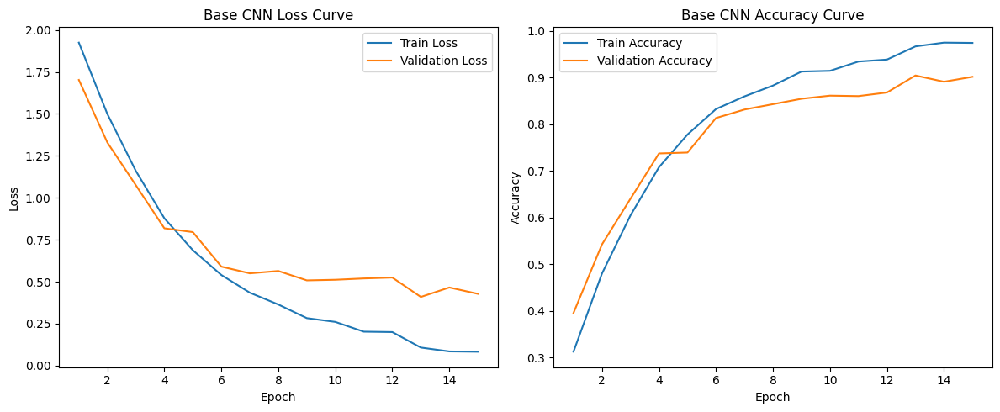

In [61]:
import matplotlib.pyplot as plt

# Plot Curves: Base CNN
epochs_range = range(1, len(history_base["train_loss"]) + 1)

plt.figure(figsize=(12, 5))

# Loss Curve
plt.subplot(1, 2, 1)
plt.plot(epochs_range, history_base["train_loss"], label="Train Loss")
plt.plot(epochs_range, history_base["val_loss"], label="Validation Loss")
plt.title("Base CNN Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy Curve
plt.subplot(1, 2, 2)
plt.plot(epochs_range, history_base["train_acc"], label="Train Accuracy")
plt.plot(epochs_range, history_base["val_acc"], label="Validation Accuracy")
plt.title("Base CNN Accuracy Curve")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

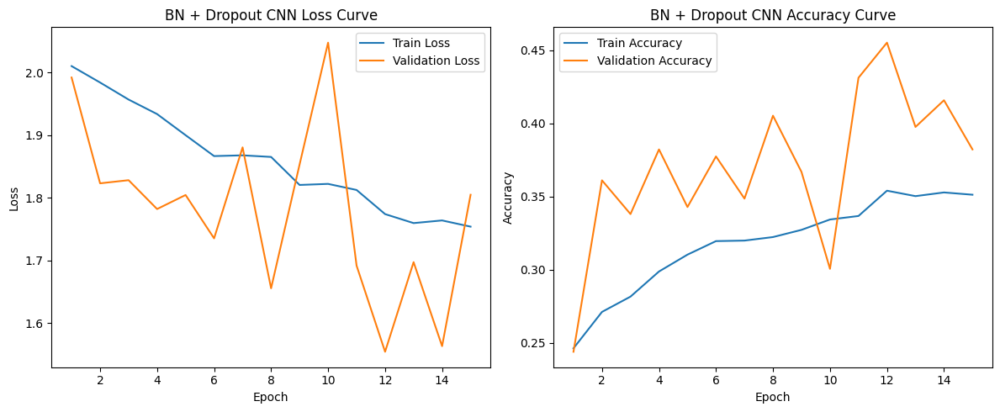

In [62]:
# Plot Curves: BN + Dropout CNN
epochs_range = range(1, len(history_bn_dropout["train_loss"]) + 1)

plt.figure(figsize=(12, 5))

# Loss Curve
plt.subplot(1, 2, 1)
plt.plot(epochs_range, history_bn_dropout["train_loss"], label="Train Loss")
plt.plot(epochs_range, history_bn_dropout["val_loss"], label="Validation Loss")
plt.title("BN + Dropout CNN Loss Curve")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Accuracy Curve
plt.subplot(1, 2, 2)
plt.plot(epochs_range, history_bn_dropout["train_acc"], label="Train Accuracy")
plt.plot(epochs_range, history_bn_dropout["val_acc"], label="Validation Accuracy")
plt.title("BN + Dropout CNN Accuracy Curve")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

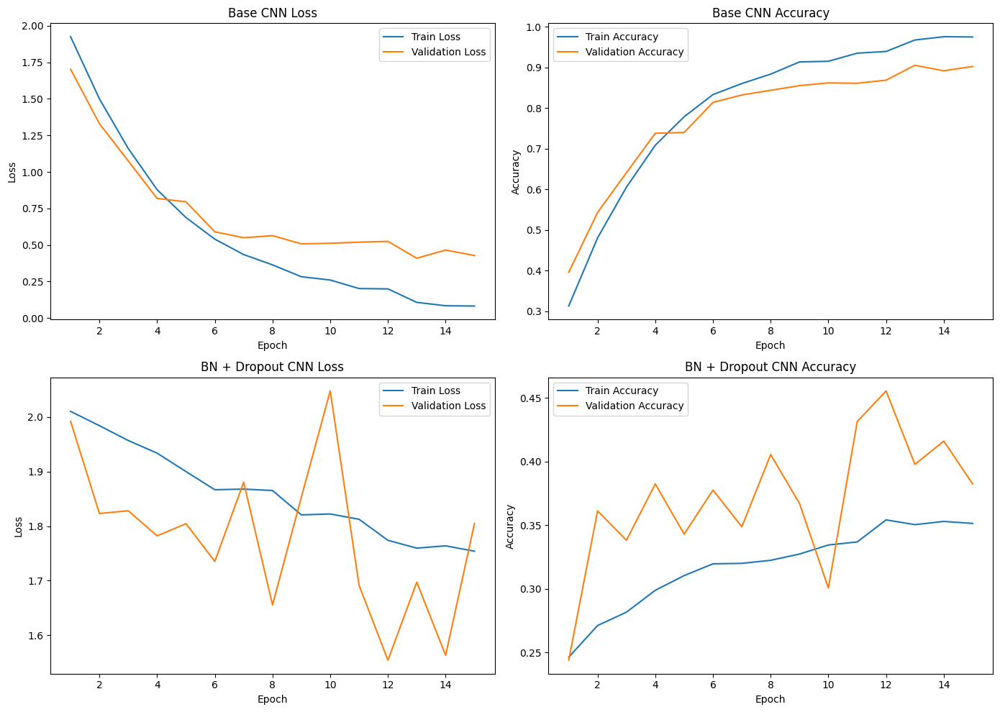

In [64]:
# Combined Comparison Plot
epochs_range = range(1, len(history_base["train_loss"]) + 1)

plt.figure(figsize=(14, 10))

# Base Model Loss
plt.subplot(2, 2, 1)
plt.plot(epochs_range, history_base["train_loss"], label="Train Loss")
plt.plot(epochs_range, history_base["val_loss"], label="Validation Loss")
plt.title("Base CNN Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# Base Model Accuracy
plt.subplot(2, 2, 2)
plt.plot(epochs_range, history_base["train_acc"], label="Train Accuracy")
plt.plot(epochs_range, history_base["val_acc"], label="Validation Accuracy")
plt.title("Base CNN Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

# BN + Dropout Loss
plt.subplot(2, 2, 3)
plt.plot(epochs_range, history_bn_dropout["train_loss"], label="Train Loss")
plt.plot(epochs_range, history_bn_dropout["val_loss"], label="Validation Loss")
plt.title("BN + Dropout CNN Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# BN + Dropout Accuracy
plt.subplot(2, 2, 4)
plt.plot(epochs_range, history_bn_dropout["train_acc"], label="Train Accuracy")
plt.plot(epochs_range, history_bn_dropout["val_acc"], label="Validation Accuracy")
plt.title("BN + Dropout CNN Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

# Model Evaluation

Evaluate on test set and report comprehensive metrics

In [65]:
import numpy as np
import pandas as pd
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

In [66]:
# Evaluate Model on Test Set

def evaluate_model_on_test(model, test_loader, criterion, device, class_names):
    model.eval()

    running_loss = 0.0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in test_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            _, preds = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    test_loss = running_loss / len(test_loader.dataset)
    test_accuracy = accuracy_score(all_labels, all_preds)
    test_precision_macro = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    test_recall_macro = recall_score(all_labels, all_preds, average='macro', zero_division=0)
    test_f1_macro = f1_score(all_labels, all_preds, average='macro', zero_division=0)

    test_precision_weighted = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    test_recall_weighted = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    test_f1_weighted = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    class_report_text = classification_report(
        all_labels,
        all_preds,
        target_names=class_names,
        zero_division=0
    )

    class_report_dict = classification_report(
        all_labels,
        all_preds,
        target_names=class_names,
        output_dict=True,
        zero_division=0
    )

    cm = confusion_matrix(all_labels, all_preds)

    results = {
        "test_loss": test_loss,
        "test_accuracy": test_accuracy,
        "test_precision_macro": test_precision_macro,
        "test_recall_macro": test_recall_macro,
        "test_f1_macro": test_f1_macro,
        "test_precision_weighted": test_precision_weighted,
        "test_recall_weighted": test_recall_weighted,
        "test_f1_weighted": test_f1_weighted,
        "classification_report_text": class_report_text,
        "classification_report_dict": class_report_dict,
        "confusion_matrix": cm,
        "y_true": all_labels,
        "y_pred": all_preds
    }

    return results

In [67]:
# Test Evaluation: Base CNN

base_test_results = evaluate_model_on_test(
    model=model_base,
    test_loader=test_loader,
    criterion=criterion_base,
    device=DEVICE,
    class_names=class_names
)

print("Base CNN Test Loss           :", round(base_test_results["test_loss"], 4))
print("Base CNN Test Accuracy       :", round(base_test_results["test_accuracy"], 4))
print("Base CNN Precision (Macro)   :", round(base_test_results["test_precision_macro"], 4))
print("Base CNN Recall (Macro)      :", round(base_test_results["test_recall_macro"], 4))
print("Base CNN F1 Score (Macro)    :", round(base_test_results["test_f1_macro"], 4))
print("Base CNN Precision (Weighted):", round(base_test_results["test_precision_weighted"], 4))
print("Base CNN Recall (Weighted)   :", round(base_test_results["test_recall_weighted"], 4))
print("Base CNN F1 Score (Weighted) :", round(base_test_results["test_f1_weighted"], 4))

print("\nClassification Report for Base CNN:\n")
print(base_test_results["classification_report_text"])

Base CNN Test Loss           : 0.5
Base CNN Test Accuracy       : 0.8876
Base CNN Precision (Macro)   : 0.8865
Base CNN Recall (Macro)      : 0.8729
Base CNN F1 Score (Macro)    : 0.8778
Base CNN Precision (Weighted): 0.8915
Base CNN Recall (Weighted)   : 0.8876
Base CNN F1 Score (Weighted) : 0.8871

Classification Report for Base CNN:

                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.80      0.77      0.79        48
   bacterial_leaf_streak       0.92      0.87      0.89        38
bacterial_panicle_blight       0.90      0.82      0.86        33
                   blast       0.84      0.94      0.89       174
              brown_spot       0.87      0.90      0.88        97
              dead_heart       0.97      0.90      0.94       144
            downy_mildew       0.89      0.87      0.88        62
                   hispa       0.95      0.78      0.86       160
                  normal       0.89      0.93      0.91       176


In [68]:
# Test Evaluation: BN + Dropout CNN

bn_dropout_test_results = evaluate_model_on_test(
    model=model_bn_dropout,
    test_loader=test_loader,
    criterion=criterion_bn_dropout,
    device=DEVICE,
    class_names=class_names
)

print("BN + Dropout CNN Test Loss           :", round(bn_dropout_test_results["test_loss"], 4))
print("BN + Dropout CNN Test Accuracy       :", round(bn_dropout_test_results["test_accuracy"], 4))
print("BN + Dropout CNN Precision (Macro)   :", round(bn_dropout_test_results["test_precision_macro"], 4))
print("BN + Dropout CNN Recall (Macro)      :", round(bn_dropout_test_results["test_recall_macro"], 4))
print("BN + Dropout CNN F1 Score (Macro)    :", round(bn_dropout_test_results["test_f1_macro"], 4))
print("BN + Dropout CNN Precision (Weighted):", round(bn_dropout_test_results["test_precision_weighted"], 4))
print("BN + Dropout CNN Recall (Weighted)   :", round(bn_dropout_test_results["test_recall_weighted"], 4))
print("BN + Dropout CNN F1 Score (Weighted) :", round(bn_dropout_test_results["test_f1_weighted"], 4))

print("\nClassification Report for BN + Dropout CNN:\n")
print(bn_dropout_test_results["classification_report_text"])

BN + Dropout CNN Test Loss           : 1.7982
BN + Dropout CNN Test Accuracy       : 0.3814
BN + Dropout CNN Precision (Macro)   : 0.191
BN + Dropout CNN Recall (Macro)      : 0.2391
BN + Dropout CNN F1 Score (Macro)    : 0.1964
BN + Dropout CNN Precision (Weighted): 0.2904
BN + Dropout CNN Recall (Weighted)   : 0.3814
BN + Dropout CNN F1 Score (Weighted) : 0.3062

Classification Report for BN + Dropout CNN:

                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.00      0.00      0.00        48
   bacterial_leaf_streak       0.00      0.00      0.00        38
bacterial_panicle_blight       0.00      0.00      0.00        33
                   blast       0.30      0.64      0.41       174
              brown_spot       0.00      0.00      0.00        97
              dead_heart       0.95      0.57      0.71       144
            downy_mildew       0.00      0.00      0.00        62
                   hispa       0.17      0.27      0.21   

In [69]:
# Compare Both Models on Test Set

comparison_df = pd.DataFrame({
    "Metric": [
        "Test Loss",
        "Test Accuracy",
        "Precision Macro",
        "Recall Macro",
        "F1 Macro",
        "Precision Weighted",
        "Recall Weighted",
        "F1 Weighted"
    ],
    "Base CNN": [
        base_test_results["test_loss"],
        base_test_results["test_accuracy"],
        base_test_results["test_precision_macro"],
        base_test_results["test_recall_macro"],
        base_test_results["test_f1_macro"],
        base_test_results["test_precision_weighted"],
        base_test_results["test_recall_weighted"],
        base_test_results["test_f1_weighted"]
    ],
    "BN + Dropout CNN": [
        bn_dropout_test_results["test_loss"],
        bn_dropout_test_results["test_accuracy"],
        bn_dropout_test_results["test_precision_macro"],
        bn_dropout_test_results["test_recall_macro"],
        bn_dropout_test_results["test_f1_macro"],
        bn_dropout_test_results["test_precision_weighted"],
        bn_dropout_test_results["test_recall_weighted"],
        bn_dropout_test_results["test_f1_weighted"]
    ]
})

comparison_df

,Metric,Base CNN,BN + Dropout CNN
0,Test Loss,0.500028,1.798155
1,Test Accuracy,0.887608,0.381364
2,Precision Macro,0.886515,0.190967
3,Recall Macro,0.872864,0.239096
4,F1 Macro,0.877823,0.196445
5,Precision Weighted,0.891468,0.290381
6,Recall Weighted,0.887608,0.381364
7,F1 Weighted,0.887150,0.306231


Generate confusion matrix visualization

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Confusion Matrix Plot Function

def plot_confusion_matrix(cm, class_names, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title(title)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.tight_layout()
    plt.show()

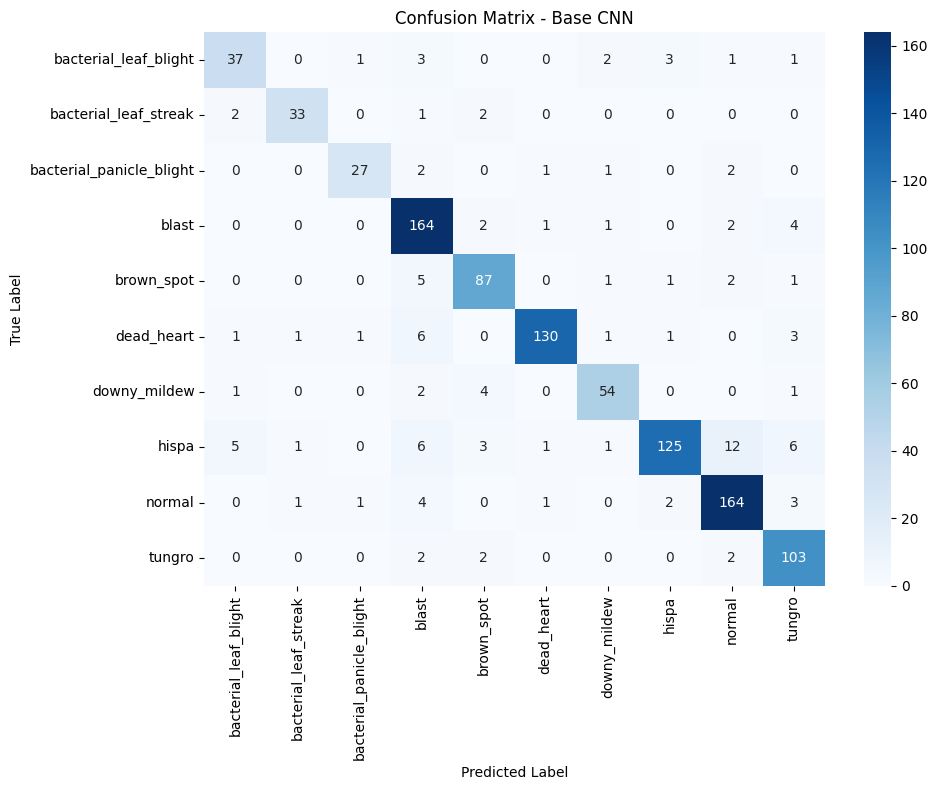

In [71]:
# Confusion Matrix: Base CNN

plot_confusion_matrix(
    base_test_results["confusion_matrix"],
    class_names,
    "Confusion Matrix - Base CNN"
)

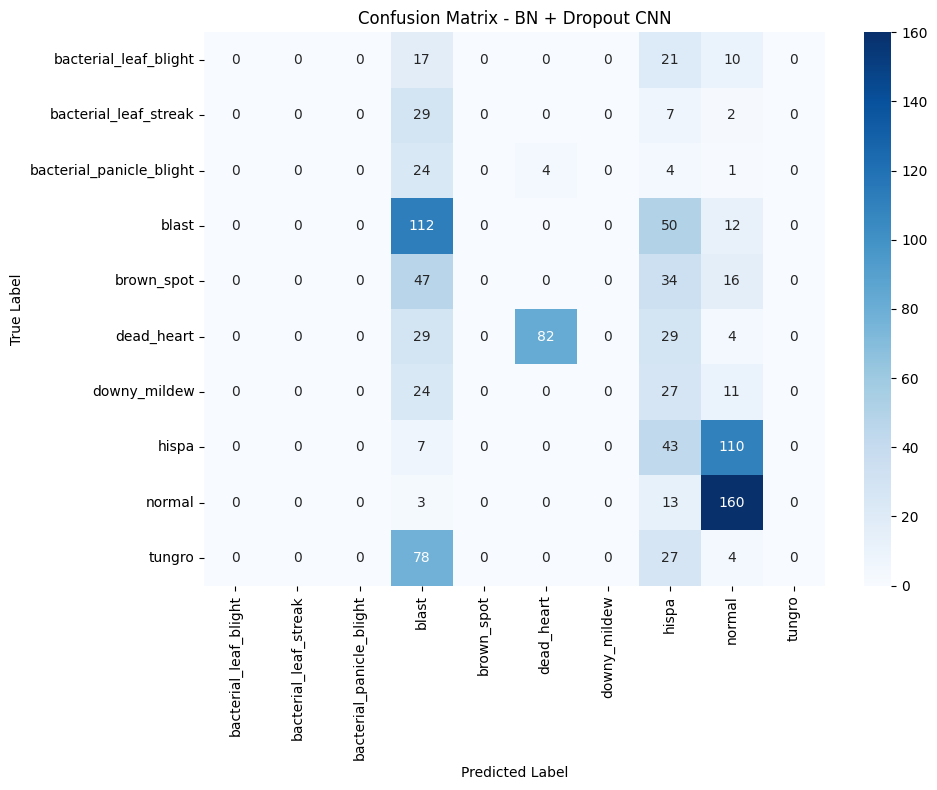

In [72]:
# Confusion Matrix: BN + Dropout CNN

plot_confusion_matrix(
    bn_dropout_test_results["confusion_matrix"],
    class_names,
    "Confusion Matrix - BN + Dropout CNN"
)

Analyze per-class performance (best and worst performing classes)

In [73]:
# Per-Class Performance Function

def get_per_class_df(report_dict):
    df = pd.DataFrame(report_dict).transpose()

    # remove overall rows
    df = df.drop(index=["accuracy", "macro avg", "weighted avg"], errors="ignore")

    return df

In [74]:
# Per-Class Analysis: Base CNN

base_class_df = get_per_class_df(base_test_results["classification_report_dict"])

print("Base CNN Per-Class Performance:\n")
display(base_class_df)

best_base_class = base_class_df["f1-score"].idxmax()
worst_base_class = base_class_df["f1-score"].idxmin()

print("Best Performing Class (Base CNN) :", best_base_class)
print("Worst Performing Class (Base CNN):", worst_base_class)

Base CNN Per-Class Performance:



,precision,recall,f1-score,support
bacterial_leaf_blight,0.804348,0.770833,0.787234,48.0
bacterial_leaf_streak,0.916667,0.868421,0.891892,38.0
bacterial_panicle_blight,0.900000,0.818182,0.857143,33.0
blast,0.841026,0.942529,0.888889,174.0
brown_spot,0.870000,0.896907,0.883249,97.0
dead_heart,0.970149,0.902778,0.935252,144.0
downy_mildew,0.885246,0.870968,0.878049,62.0
hispa,0.946970,0.781250,0.856164,160.0
normal,0.886486,0.931818,0.908587,176.0
tungro,0.844262,0.944954,0.891775,109.0


Best Performing Class (Base CNN) : dead_heart
Worst Performing Class (Base CNN): bacterial_leaf_blight


In [75]:
# Per-Class Analysis: BN + Dropout CNN

bn_class_df = get_per_class_df(bn_dropout_test_results["classification_report_dict"])

print("BN + Dropout CNN Per-Class Performance:\n")
display(bn_class_df)

best_bn_class = bn_class_df["f1-score"].idxmax()
worst_bn_class = bn_class_df["f1-score"].idxmin()

print("Best Performing Class (BN + Dropout CNN) :", best_bn_class)
print("Worst Performing Class (BN + Dropout CNN):", worst_bn_class)

BN + Dropout CNN Per-Class Performance:



,precision,recall,f1-score,support
bacterial_leaf_blight,0.000000,0.000000,0.000000,48.0
bacterial_leaf_streak,0.000000,0.000000,0.000000,38.0
bacterial_panicle_blight,0.000000,0.000000,0.000000,33.0
blast,0.302703,0.643678,0.411765,174.0
brown_spot,0.000000,0.000000,0.000000,97.0
dead_heart,0.953488,0.569444,0.713043,144.0
downy_mildew,0.000000,0.000000,0.000000,62.0
hispa,0.168627,0.268750,0.207229,160.0
normal,0.484848,0.909091,0.632411,176.0
tungro,0.000000,0.000000,0.000000,109.0


Best Performing Class (BN + Dropout CNN) : dead_heart
Worst Performing Class (BN + Dropout CNN): bacterial_leaf_blight


In [76]:
print("Base CNN -> Best Class :", best_base_class, "| Worst Class :", worst_base_class)
print("BN + Dropout CNN -> Best Class :", best_bn_class, "| Worst Class :", worst_bn_class)

Base CNN -> Best Class : dead_heart | Worst Class : bacterial_leaf_blight
BN + Dropout CNN -> Best Class : dead_heart | Worst Class : bacterial_leaf_blight


Save trained model weights

In [77]:
# Create Save Directory

SAVE_DIR = os.path.join(BASE_DIR, "saved_models")
os.makedirs(SAVE_DIR, exist_ok=True)

print("Save Directory:", SAVE_DIR)

Save Directory: /content/drive/MyDrive/CVPR Dataset/saved_models


In [78]:
# Save Base CNN Weights

base_model_path = os.path.join(SAVE_DIR, "customcnn_base.pth")
torch.save(model_base.state_dict(), base_model_path)

print("Base CNN weights saved to:", base_model_path)

Base CNN weights saved to: /content/drive/MyDrive/CVPR Dataset/saved_models/customcnn_base.pth


In [79]:
# Save BN + Dropout CNN Weights

bn_dropout_model_path = os.path.join(SAVE_DIR, "customcnn_bn_dropout.pth")
torch.save(model_bn_dropout.state_dict(), bn_dropout_model_path)

print("BN + Dropout CNN weights saved to:", bn_dropout_model_path)

BN + Dropout CNN weights saved to: /content/drive/MyDrive/CVPR Dataset/saved_models/customcnn_bn_dropout.pth


In [80]:
print("Saved files:")
print("-", base_model_path)
print("-", bn_dropout_model_path)

Saved files:
- /content/drive/MyDrive/CVPR Dataset/saved_models/customcnn_base.pth
- /content/drive/MyDrive/CVPR Dataset/saved_models/customcnn_bn_dropout.pth


Saved model link :
https://drive.google.com/drive/folders/1UAg3PLKo_93y8cz29Nlf2UAbwDOmdfPc?dmr=1&ec=wgc-drive-%5Bmodule%5D-goto

# Model Justification

In [81]:
!pip install -qq grad-cam

In [82]:
import os
import math
import random
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# =========================================================
# Choose which trained model you want to analyze
# =========================================================
analysis_model = model_base              # change to model_bn_dropout if needed
analysis_model_name = "Base CNN"         # change text if needed

analysis_model.eval()

RANDOM_VIS_SEED = 42
random.seed(RANDOM_VIS_SEED)
np.random.seed(RANDOM_VIS_SEED)
torch.manual_seed(RANDOM_VIS_SEED)

# ---------------------------------------------------------
# Helper: get metadata from Subset without breaking anything
# ---------------------------------------------------------
def get_subset_metadata(subset, subset_idx):
    dataset_idx = subset.indices[subset_idx] if hasattr(subset, "indices") else subset_idx

    path = None
    stored_label = None

    if hasattr(subset.dataset, "samples"):
        path, stored_label = subset.dataset.samples[dataset_idx]

    return dataset_idx, path, stored_label


# ---------------------------------------------------------
# Helper: get actual image tensor + label + path from subset
# ---------------------------------------------------------
def get_subset_image(subset, subset_idx):
    image_tensor, label = subset[subset_idx]
    _, path, _ = get_subset_metadata(subset, subset_idx)
    return image_tensor, int(label), path


# ---------------------------------------------------------
# Helper: tensor -> displayable numpy image
# ---------------------------------------------------------
def tensor_to_display_image(image_tensor):
    image_np = image_tensor.detach().cpu().permute(1, 2, 0).numpy()
    image_np = np.clip(image_np, 0, 1)
    return image_np


# ---------------------------------------------------------
# Helper: random sample from list
# ---------------------------------------------------------
def sample_examples(example_list, n, seed=42):
    if len(example_list) == 0:
        return []
    n = min(n, len(example_list))
    rng = random.Random(seed)
    return rng.sample(example_list, n)


# ---------------------------------------------------------
# Helper: short reason text for wrong predictions
# ---------------------------------------------------------
def build_failure_reason(example):
    conf = example["confidence"]
    margin = example["margin"]
    pred_class = example["pred_class"]
    second_class = example["second_class"]

    if conf < 0.50:
        return "Low confidence: image may be ambiguous, blurred, low-contrast, or the infected region may be small."
    elif margin < 0.15:
        return f"Close confusion: it shares similar visual cues with '{pred_class}' and '{second_class}'."
    elif conf > 0.85:
        return "Strong but wrong decision: the model likely focused on a very similar disease texture or a distracting region."
    else:
        return f"Possible causes: similar lesion/color pattern to '{pred_class}', partial disease visibility, or background distraction."

Random unseen test image prediction

In [83]:
def collect_test_predictions(model, loader, subset, class_names, device):
    model.eval()
    collected = []
    running_index = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu()
            labels = labels.cpu()

            batch_size = images.size(0)

            for i in range(batch_size):
                subset_idx = running_index + i
                _, path, _ = get_subset_metadata(subset, subset_idx)

                topk = torch.topk(probs[i], k=min(2, len(class_names)))
                pred_idx = int(topk.indices[0].item())
                second_idx = int(topk.indices[1].item()) if len(class_names) > 1 else pred_idx

                confidence = float(topk.values[0].item())
                second_conf = float(topk.values[1].item()) if len(class_names) > 1 else 0.0

                true_idx = int(labels[i].item())

                collected.append({
                    "subset_idx": subset_idx,
                    "path": path,
                    "true_label_idx": true_idx,
                    "true_class": class_names[true_idx],
                    "pred_label_idx": pred_idx,
                    "pred_class": class_names[pred_idx],
                    "confidence": confidence,
                    "second_label_idx": second_idx,
                    "second_class": class_names[second_idx],
                    "second_confidence": second_conf,
                    "margin": confidence - second_conf,
                    "is_correct": pred_idx == true_idx
                })

            running_index += batch_size

    return collected


analysis_predictions = collect_test_predictions(
    model=analysis_model,
    loader=test_loader,
    subset=test_subset,
    class_names=class_names,
    device=DEVICE
)

correct_predictions = [x for x in analysis_predictions if x["is_correct"]]
wrong_predictions   = [x for x in analysis_predictions if not x["is_correct"]]

# difficult but correct = lowest-confidence correct samples
hard_correct_predictions = sorted(correct_predictions, key=lambda x: x["confidence"])[:min(5, len(correct_predictions))]

print("Analysis model      :", analysis_model_name)
print("Total test samples  :", len(analysis_predictions))
print("Correct predictions :", len(correct_predictions))
print("Wrong predictions   :", len(wrong_predictions))
print("Hard correct samples:", len(hard_correct_predictions))

Analysis model      : Base CNN
Total test samples  : 1041
Correct predictions : 924
Wrong predictions   : 117
Hard correct samples: 5


In [84]:
def show_prediction_examples(examples, subset, title, ncols=4, show_reason=False):
    if len(examples) == 0:
        print("No examples to show.")
        return

    nrows = math.ceil(len(examples) / ncols)
    plt.figure(figsize=(4.5 * ncols, 4.6 * nrows))

    for plot_idx, example in enumerate(examples, start=1):
        image_tensor, _, _ = get_subset_image(subset, example["subset_idx"])
        image_np = tensor_to_display_image(image_tensor)

        plt.subplot(nrows, ncols, plot_idx)
        plt.imshow(image_np)
        plt.axis("off")

        title_color = "green" if example["is_correct"] else "red"

        title_text = (
            f"Pred: {example['pred_class']} ({example['confidence']*100:.1f}%)\n"
            f"True: {example['true_class']}"
        )

        if show_reason and not example["is_correct"]:
            title_text += f"\n{build_failure_reason(example)}"

        plt.title(title_text, fontsize=9, color=title_color)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

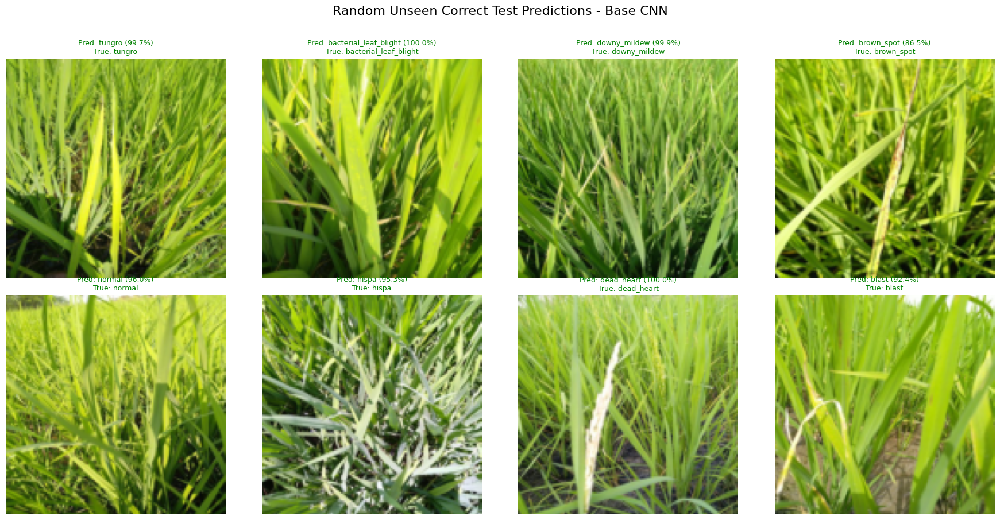

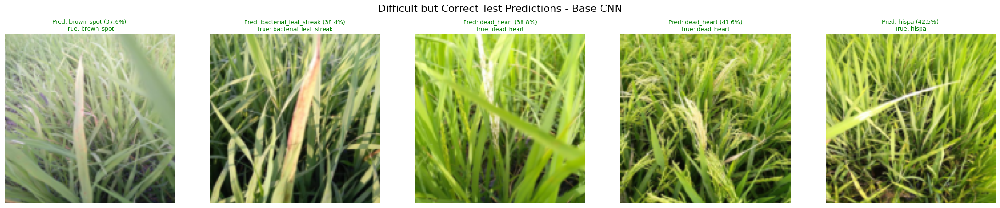

In [85]:
# 8 random correct predictions
random_correct_examples = sample_examples(correct_predictions, n=8, seed=42)

show_prediction_examples(
    examples=random_correct_examples,
    subset=test_subset,
    title=f"Random Unseen Correct Test Predictions - {analysis_model_name}",
    ncols=4,
    show_reason=False
)

# difficult but correct predictions (lowest confidence among correct ones)
show_prediction_examples(
    examples=hard_correct_predictions,
    subset=test_subset,
    title=f"Difficult but Correct Test Predictions - {analysis_model_name}",
    ncols=5,
    show_reason=False
)

Misclassified image analysis

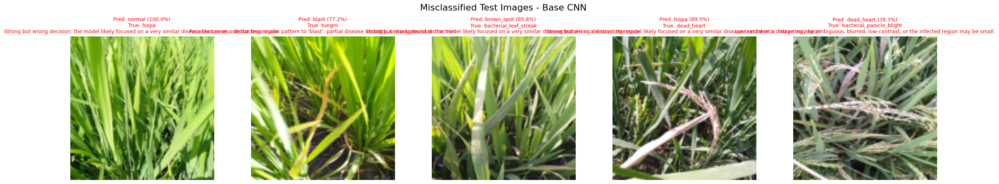

In [86]:
# 5 random wrong predictions
random_wrong_examples = sample_examples(wrong_predictions, n=5, seed=123)

show_prediction_examples(
    examples=random_wrong_examples,
    subset=test_subset,
    title=f"Misclassified Test Images - {analysis_model_name}",
    ncols=5,
    show_reason=True
)

In [87]:
misclassified_df = pd.DataFrame([
    {
        "true_class": x["true_class"],
        "pred_class": x["pred_class"],
        "confidence": round(x["confidence"], 4),
        "second_class": x["second_class"],
        "second_confidence": round(x["second_confidence"], 4),
        "reason_hint": build_failure_reason(x)
    }
    for x in random_wrong_examples
])

display(misclassified_df)

,true_class,pred_class,confidence,second_class,second_confidence,reason_hint
0,hispa,normal,0.9998,hispa,0.0002,Strong but wrong decision: the model likely fo...
1,tungro,blast,0.7723,tungro,0.2272,Possible causes: similar lesion/color pattern ...
2,bacterial_leaf_streak,brown_spot,0.8578,bacterial_leaf_streak,0.1410,Strong but wrong decision: the model likely fo...
3,dead_heart,hispa,0.8948,dead_heart,0.0914,Strong but wrong decision: the model likely fo...
4,bacterial_panicle_blight,dead_heart,0.3934,bacterial_panicle_blight,0.3344,"Low confidence: image may be ambiguous, blurre..."


Three conv. layer feature maps

In [88]:
def get_feature_maps_from_three_layers(model, image_tensor, device):
    model.eval()
    activations = {}
    hook_handles = []

    # Using ReLU outputs from each conv block for cleaner feature maps
    layers_to_hook = {
        "Layer 1 (after ReLU1)": model.relu1,
        "Layer 2 (after ReLU2)": model.relu2,
        "Layer 3 (after ReLU3)": model.relu3,
    }

    def make_hook(name):
        def hook(module, input, output):
            activations[name] = output.detach().cpu()
        return hook

    for name, layer in layers_to_hook.items():
        hook_handles.append(layer.register_forward_hook(make_hook(name)))

    with torch.no_grad():
        _ = model(image_tensor.unsqueeze(0).to(device))

    for handle in hook_handles:
        handle.remove()

    return activations


def plot_feature_maps(activations, image_tensor, example_title="", maps_per_layer=8):
    original_image = tensor_to_display_image(image_tensor)

    plt.figure(figsize=(4, 4))
    plt.imshow(original_image)
    plt.axis("off")
    plt.title(f"Original Image\n{example_title}")
    plt.show()

    for layer_name, fmap in activations.items():
        fmap = fmap[0]  # shape: [C, H, W]
        num_maps = min(maps_per_layer, fmap.shape[0])

        ncols = 4
        nrows = math.ceil(num_maps / ncols)

        plt.figure(figsize=(3.2 * ncols, 3.0 * nrows))
        for i in range(num_maps):
            plt.subplot(nrows, ncols, i + 1)
            plt.imshow(fmap[i].numpy(), cmap="viridis")
            plt.axis("off")
            plt.title(f"Map {i+1}", fontsize=9)

        plt.suptitle(f"{layer_name} Feature Maps\n{example_title}", fontsize=14)
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

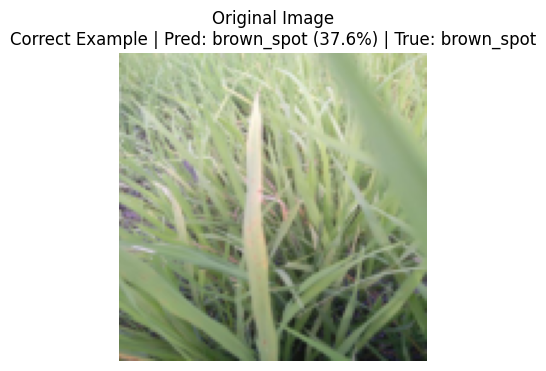

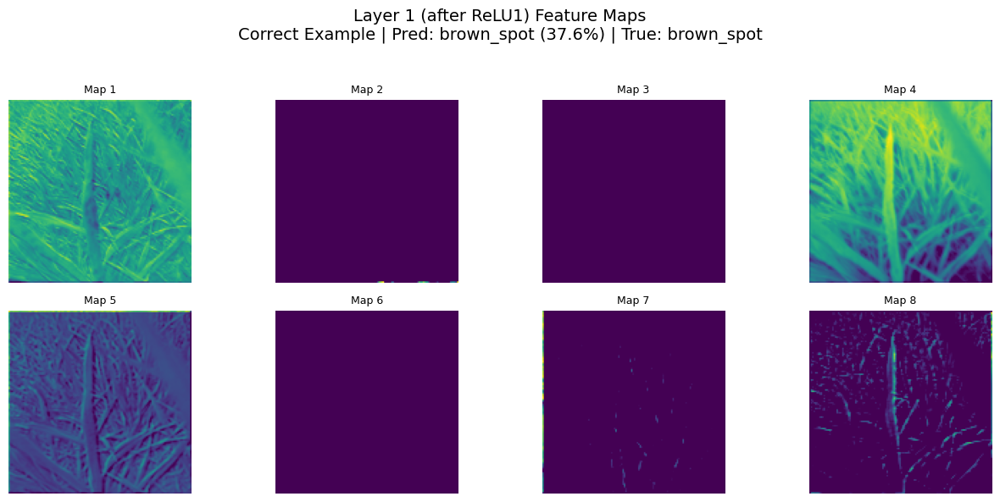

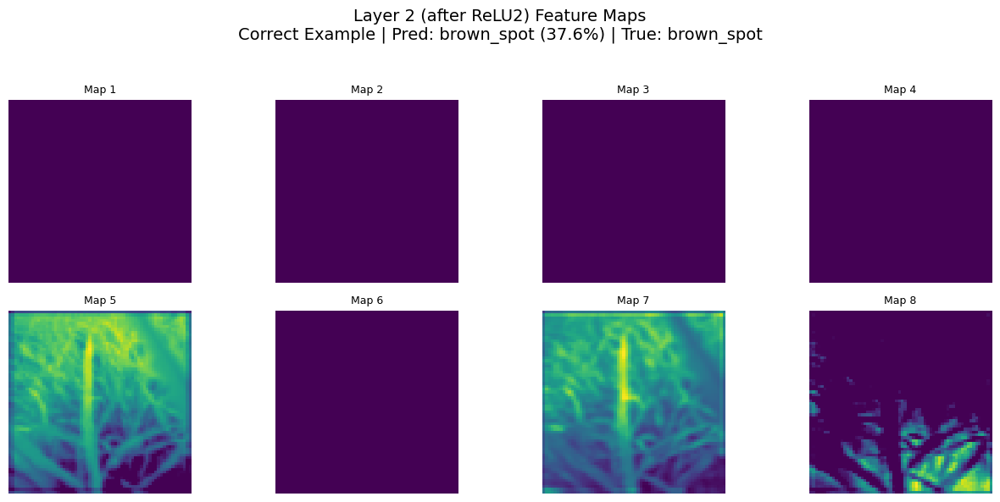

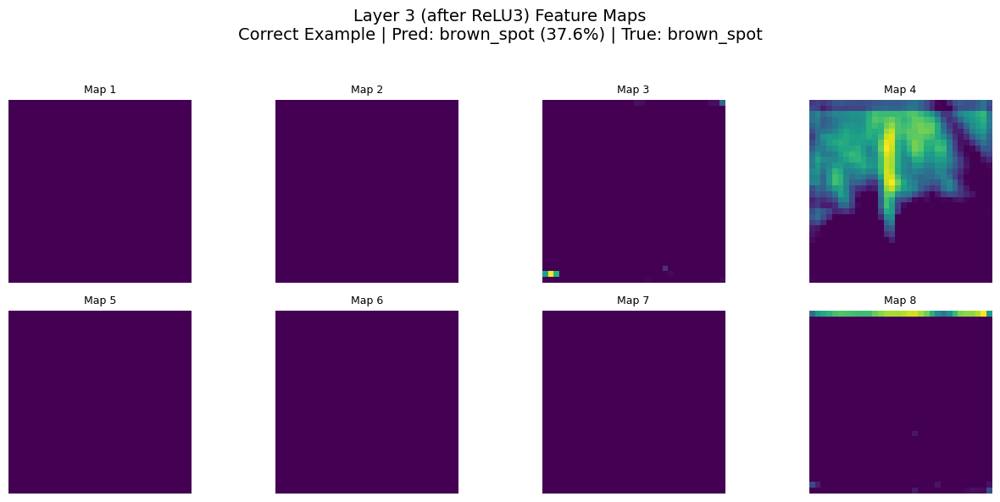

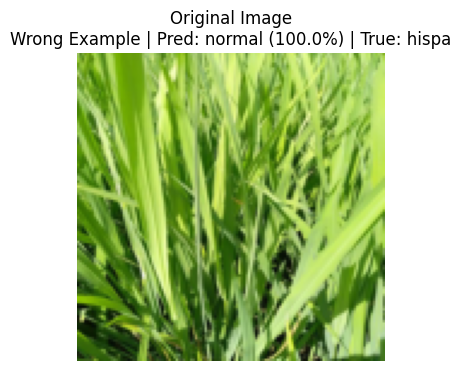

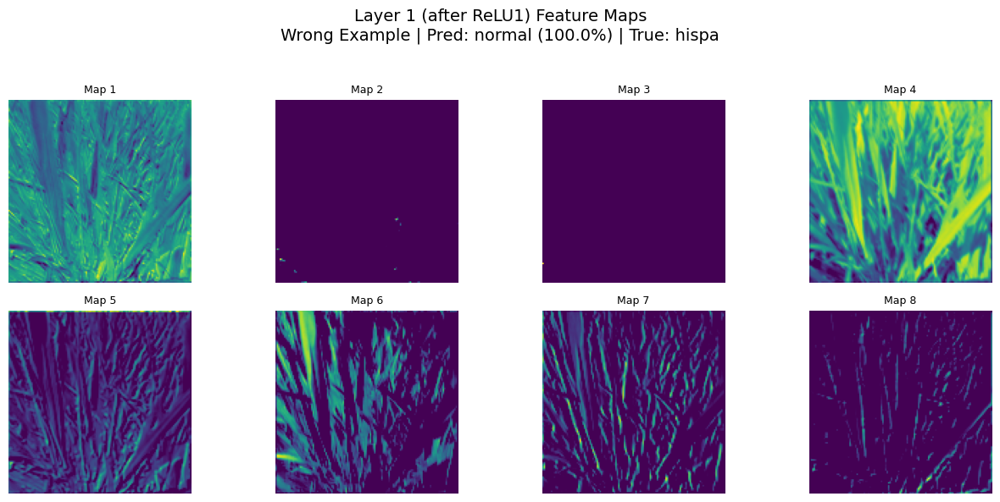

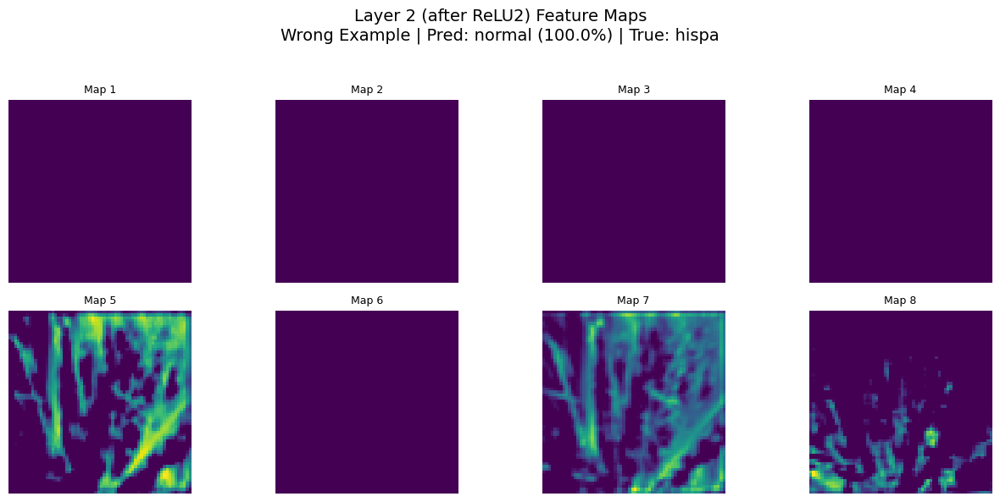

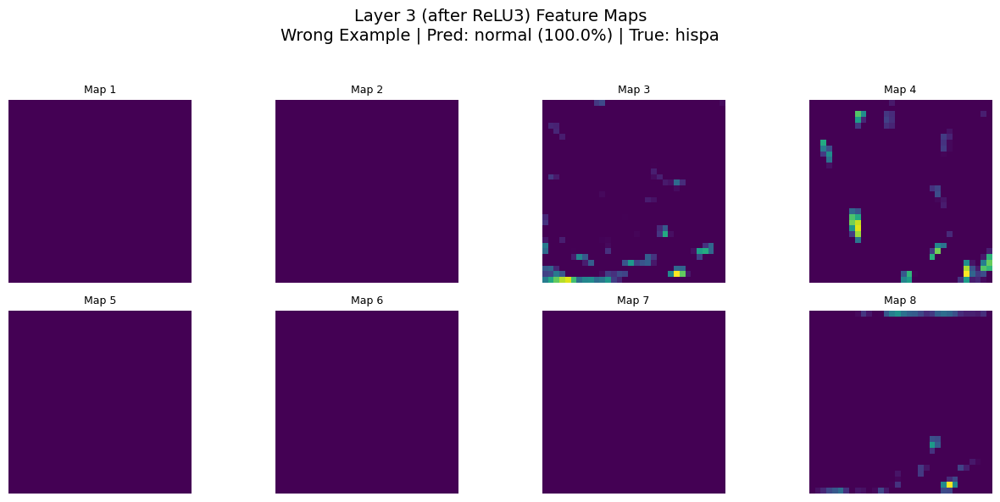

In [89]:
# Choose one correct example and one wrong example
feature_example_correct = hard_correct_predictions[0] if len(hard_correct_predictions) > 0 else correct_predictions[0]
feature_example_wrong = random_wrong_examples[0] if len(random_wrong_examples) > 0 else None

# Correct example feature maps
img_tensor_correct, _, _ = get_subset_image(test_subset, feature_example_correct["subset_idx"])
correct_activations = get_feature_maps_from_three_layers(analysis_model, img_tensor_correct, DEVICE)

plot_feature_maps(
    activations=correct_activations,
    image_tensor=img_tensor_correct,
    example_title=(
        f"Correct Example | Pred: {feature_example_correct['pred_class']} "
        f"({feature_example_correct['confidence']*100:.1f}%) | "
        f"True: {feature_example_correct['true_class']}"
    ),
    maps_per_layer=8
)

# Wrong example feature maps
if feature_example_wrong is not None:
    img_tensor_wrong, _, _ = get_subset_image(test_subset, feature_example_wrong["subset_idx"])
    wrong_activations = get_feature_maps_from_three_layers(analysis_model, img_tensor_wrong, DEVICE)

    plot_feature_maps(
        activations=wrong_activations,
        image_tensor=img_tensor_wrong,
        example_title=(
            f"Wrong Example | Pred: {feature_example_wrong['pred_class']} "
            f"({feature_example_wrong['confidence']*100:.1f}%) | "
            f"True: {feature_example_wrong['true_class']}"
        ),
        maps_per_layer=8
    )

Grad-CAM

In [90]:
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.activations = None
        self.gradients = None

        self.forward_handle = self.target_layer.register_forward_hook(self._forward_hook)
        self.backward_handle = self.target_layer.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.activations = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def generate(self, input_tensor, class_idx=None):
        self.model.eval()
        self.model.zero_grad()

        outputs = self.model(input_tensor)

        if class_idx is None:
            class_idx = int(outputs.argmax(dim=1).item())

        score = outputs[:, class_idx]
        score.backward(retain_graph=True)

        gradients = self.gradients[0]      # [C, H, W]
        activations = self.activations[0]  # [C, H, W]

        weights = gradients.mean(dim=(1, 2))  # [C]

        cam = torch.zeros(activations.shape[1:], device=activations.device)
        for channel_idx, weight in enumerate(weights):
            cam += weight * activations[channel_idx]

        cam = F.relu(cam)

        if cam.max() > 0:
            cam = cam / cam.max()

        cam = cam.unsqueeze(0).unsqueeze(0)
        cam = F.interpolate(
            cam,
            size=(IMG_SIZE, IMG_SIZE),
            mode="bilinear",
            align_corners=False
        )

        return cam.squeeze().detach().cpu().numpy(), outputs.detach()

    def remove(self):
        self.forward_handle.remove()
        self.backward_handle.remove()


def overlay_cam_on_image(image_tensor, cam, alpha=0.35):
    image_np = tensor_to_display_image(image_tensor)
    heatmap = plt.get_cmap("jet")(cam)[..., :3]
    overlay = np.clip((1 - alpha) * image_np + alpha * heatmap, 0, 1)
    return image_np, heatmap, overlay


def show_gradcam_examples(model, subset, examples, device, title, max_examples=3):
    if len(examples) == 0:
        print("No Grad-CAM examples to show.")
        return

    examples = examples[:min(max_examples, len(examples))]
    gradcam = GradCAM(model, model.conv_layer3)

    plt.figure(figsize=(12, 4 * len(examples)))

    for row_idx, example in enumerate(examples):
        image_tensor, _, _ = get_subset_image(subset, example["subset_idx"])
        input_tensor = image_tensor.unsqueeze(0).to(device)

        # explain predicted class
        cam, outputs = gradcam.generate(
            input_tensor=input_tensor,
            class_idx=example["pred_label_idx"]
        )

        probs = torch.softmax(outputs, dim=1)[0].cpu()
        pred_idx = int(probs.argmax().item())
        pred_conf = float(probs[pred_idx].item())

        original, heatmap, overlay = overlay_cam_on_image(image_tensor, cam, alpha=0.35)

        plt.subplot(len(examples), 3, row_idx * 3 + 1)
        plt.imshow(original)
        plt.axis("off")
        plt.title("Original")

        plt.subplot(len(examples), 3, row_idx * 3 + 2)
        plt.imshow(heatmap)
        plt.axis("off")
        plt.title(f"Grad-CAM Heatmap\nPred: {class_names[pred_idx]} ({pred_conf*100:.1f}%)")

        plt.subplot(len(examples), 3, row_idx * 3 + 3)
        plt.imshow(overlay)
        plt.axis("off")
        plt.title(
            f"Overlay\nTrue: {example['true_class']} | Pred: {example['pred_class']}",
            color="green" if example["is_correct"] else "red"
        )

    plt.suptitle(title, fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.97])
    plt.show()

    gradcam.remove()

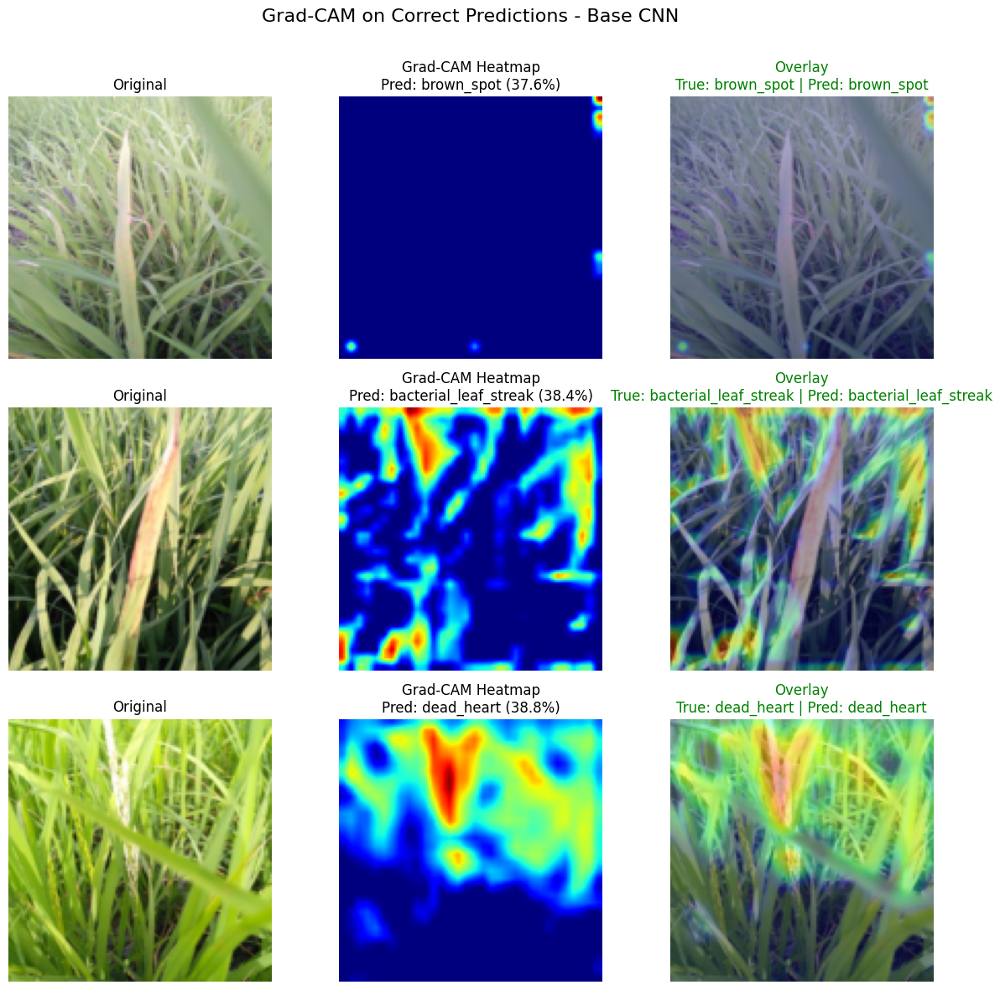

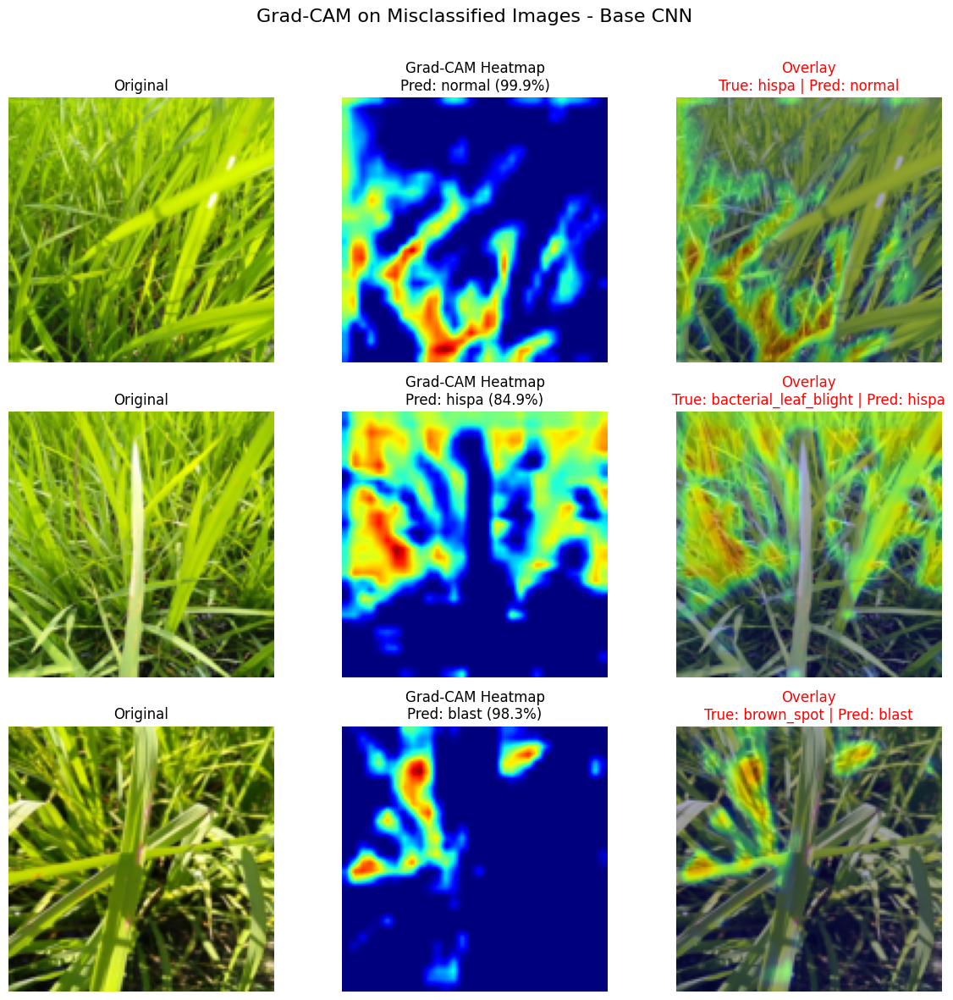

In [91]:
gradcam_correct_examples = hard_correct_predictions[:min(3, len(hard_correct_predictions))]
gradcam_wrong_examples = sample_examples(wrong_predictions, n=3, seed=7)

show_gradcam_examples(
    model=analysis_model,
    subset=test_subset,
    examples=gradcam_correct_examples,
    device=DEVICE,
    title=f"Grad-CAM on Correct Predictions - {analysis_model_name}",
    max_examples=3
)

show_gradcam_examples(
    model=analysis_model,
    subset=test_subset,
    examples=gradcam_wrong_examples,
    device=DEVICE,
    title=f"Grad-CAM on Misclassified Images - {analysis_model_name}",
    max_examples=3
)

First-layer kernels / filters

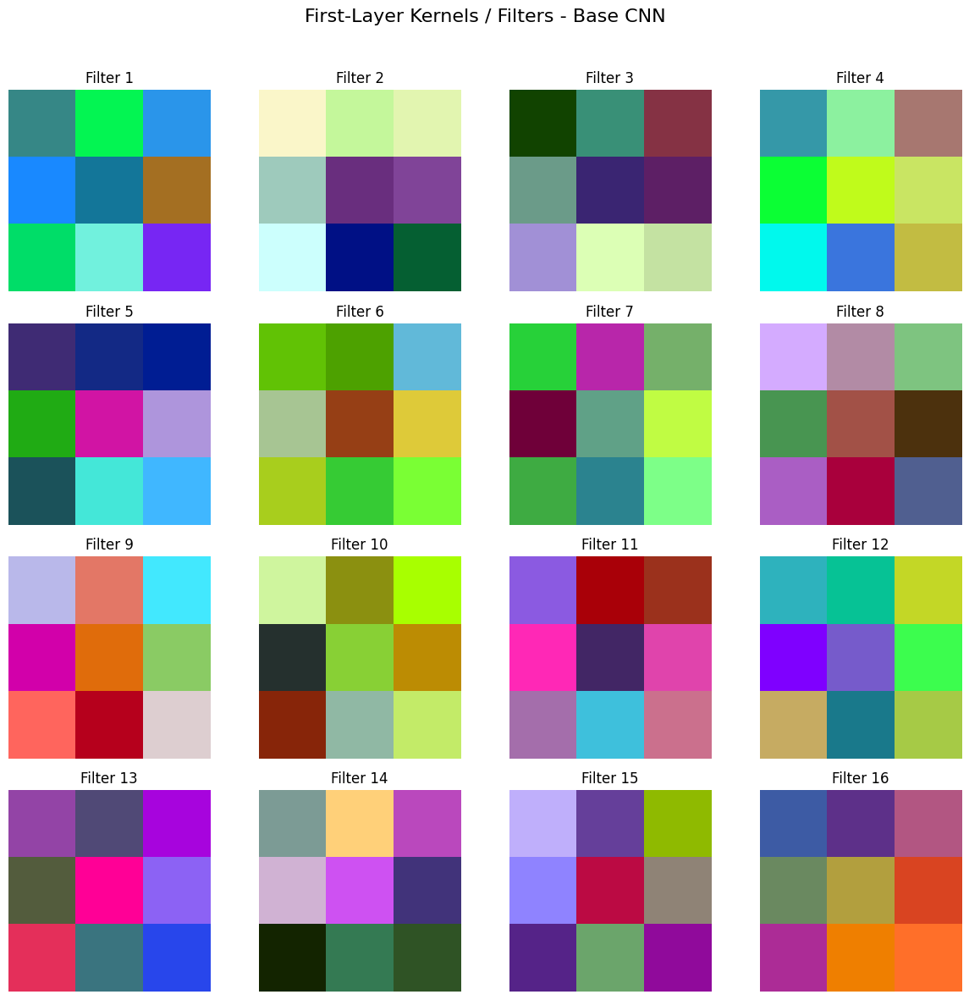

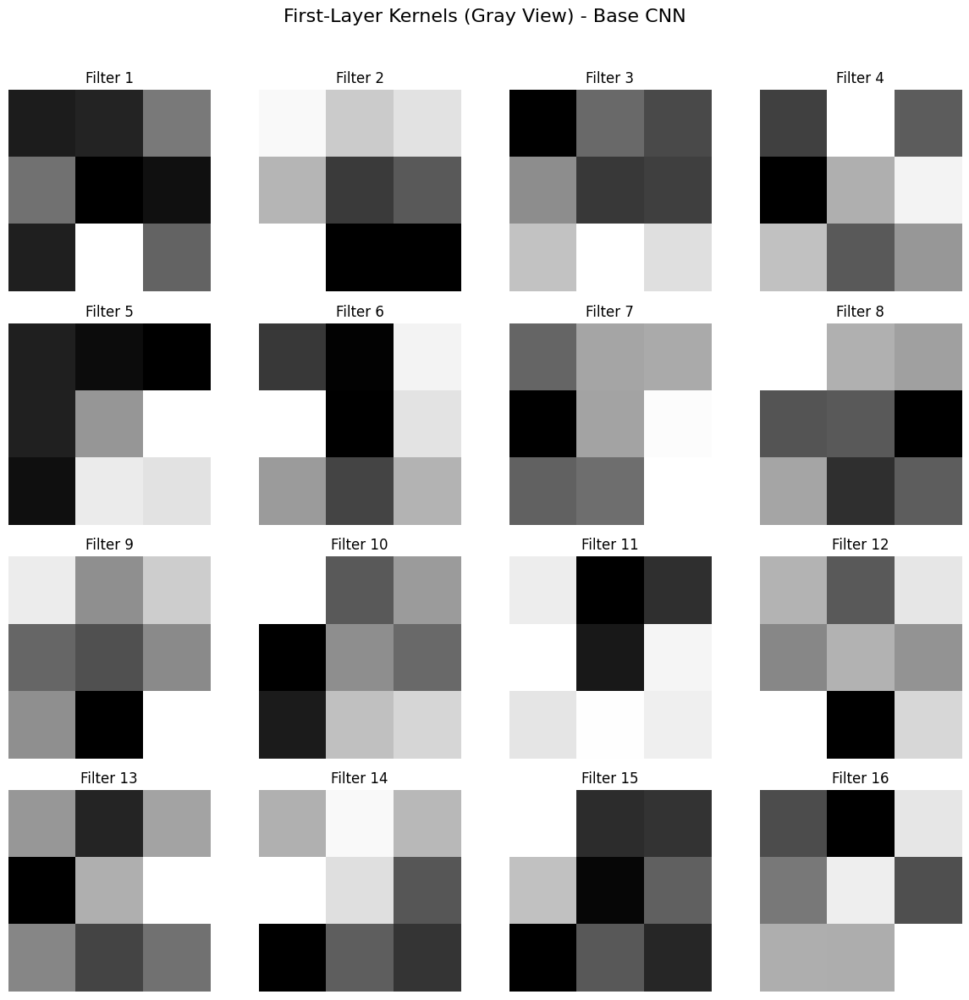

In [92]:
def plot_first_layer_kernels(model, max_filters=16):
    weights = model.conv_layer1.weight.detach().cpu()  # [out_channels, in_channels, kH, kW]
    max_filters = min(max_filters, weights.shape[0])

    ncols = 4
    nrows = math.ceil(max_filters / ncols)

    plt.figure(figsize=(3 * ncols, 3 * nrows))
    for i in range(max_filters):
        kernel = weights[i].clone()

        kernel_min = kernel.min()
        kernel_max = kernel.max()
        kernel = (kernel - kernel_min) / (kernel_max - kernel_min + 1e-8)

        kernel = kernel.permute(1, 2, 0).numpy()  # [kH, kW, 3]

        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(kernel, interpolation="nearest")
        plt.axis("off")
        plt.title(f"Filter {i+1}")

    plt.suptitle(f"First-Layer Kernels / Filters - {analysis_model_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


def plot_first_layer_kernels_grayscale(model, max_filters=16):
    weights = model.conv_layer1.weight.detach().cpu()   # [out_channels, in_channels, kH, kW]
    gray_weights = weights.mean(dim=1)                  # average across RGB channels
    max_filters = min(max_filters, gray_weights.shape[0])

    ncols = 4
    nrows = math.ceil(max_filters / ncols)

    plt.figure(figsize=(3 * ncols, 3 * nrows))
    for i in range(max_filters):
        kernel = gray_weights[i].clone()
        kernel = (kernel - kernel.min()) / (kernel.max() - kernel.min() + 1e-8)

        plt.subplot(nrows, ncols, i + 1)
        plt.imshow(kernel.numpy(), cmap="gray", interpolation="nearest")
        plt.axis("off")
        plt.title(f"Filter {i+1}")

    plt.suptitle(f"First-Layer Kernels (Gray View) - {analysis_model_name}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


plot_first_layer_kernels(analysis_model, max_filters=16)
plot_first_layer_kernels_grayscale(analysis_model, max_filters=16)